In [1]:
import numpy as np
import torch
from torch import nn, optim
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms, models

In [2]:
imsize = 224

loader = transforms.Compose([
    transforms.Resize(imsize), 
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

In [3]:
def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image

In [4]:
content_img = image_loader("data/images/landscape.jpg")
style_img = image_loader("data/images/monet.jpg")

In [5]:
unloader = transforms.Compose([
    transforms.Normalize((-0.485/0.229, -0.456/0.224, -0.406/0.225), (1/0.229, 1/0.224, 1/0.225)),
    transforms.ToPILImage()])

In [6]:
def tensor2image(tensor):
    image = tensor.clone() 
    image = image.squeeze(0)  
    image = unloader(image)
    return image

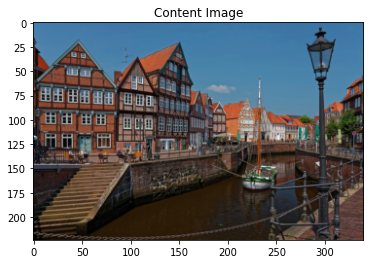

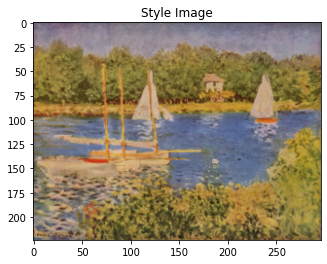

In [7]:
plt.figure()
plt.imshow(tensor2image(content_img))
plt.title("Content Image")
plt.show()

plt.figure()
plt.imshow(tensor2image(style_img))
plt.title("Style Image")
plt.show()

In [8]:
model = models.vgg19(pretrained=True).features

for param in model.parameters():
    param.requires_grad_(False)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /Users/dong/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

In [9]:
relevant_layers = {'0': 'conv1_1', '5': 'conv2_1', '10': 'conv3_1', '19': 'conv4_1', '21': 'conv4_2', '28': 'conv5_1'}

In [10]:
def features_extractor(x, model, layers):
        
    features = {}
    for index, layer in model._modules.items():
        x = layer(x)
        if index in layers:
            features[layers[index]] = x
            
    return features

In [11]:
content_features = features_extractor(content_img, model, relevant_layers)
style_features = features_extractor(style_img, model, relevant_layers)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ../c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [12]:
style_grams = {}
for i in style_features:
    layer = style_features[i]
    _, d1, d2, d3 = layer.shape
    features = layer.view(d1, d2 * d3)
    gram = torch.mm(features, features.t())
    style_grams[i] = gram

In [13]:
target_img = content_img.clone().requires_grad_(True)

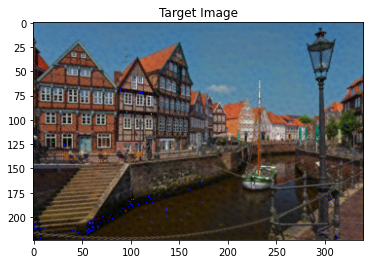

In [22]:
plt.figure()
plt.imshow(tensor2image(target_img))
plt.title("Target Image")
plt.show()

In [15]:
style_weights = {'conv1_1': 1., 'conv2_1': 0.8, 'conv3_1': 0.6, 'conv4_1': 0.4, 'conv5_1': 0.2}

In [16]:
alpha = 1
beta = 1e5

In [20]:
print_statement = 10
optimizer = torch.optim.Adam([target_img], lr=0.001)
iterations = 500

Total loss:  3384787.25


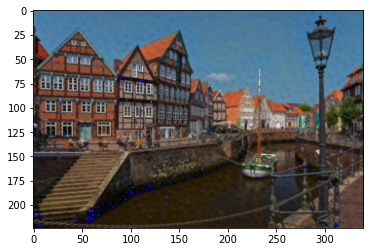

Total loss:  3101534.75


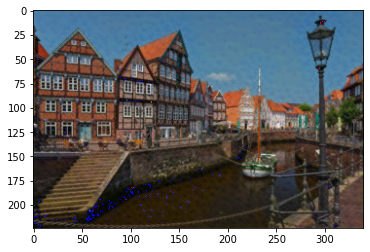

Total loss:  2834769.0


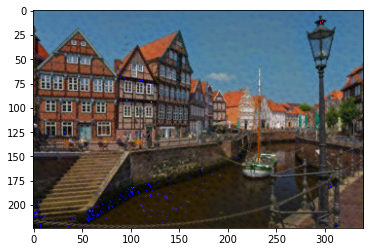

Total loss:  2608070.5


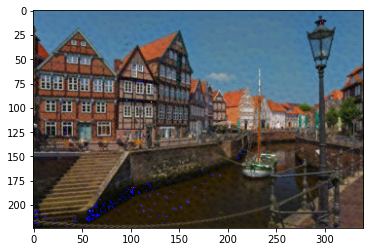

Total loss:  2413261.25


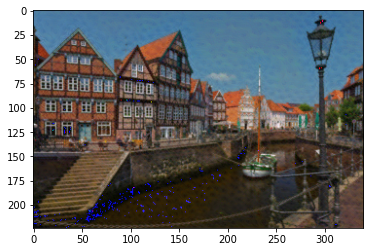

Total loss:  2244102.75


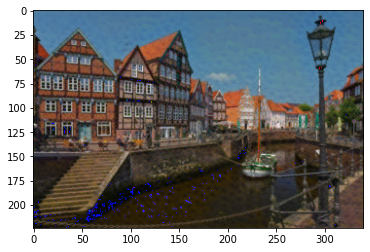

Total loss:  2095474.625


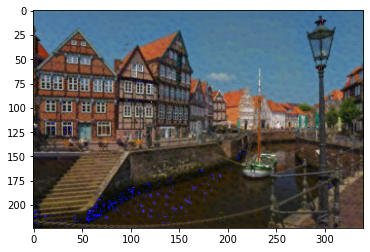

Total loss:  1963776.375


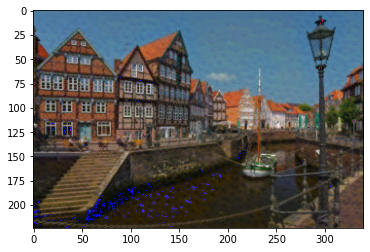

Total loss:  1846197.625


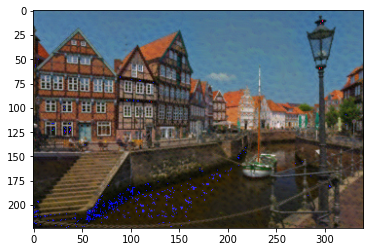

Total loss:  1740481.0


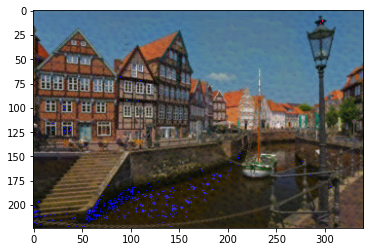

Total loss:  1644899.75


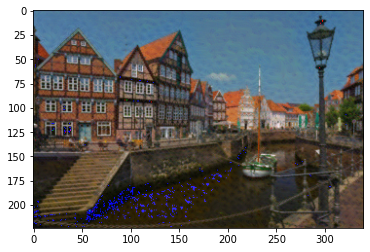

Total loss:  1557906.25


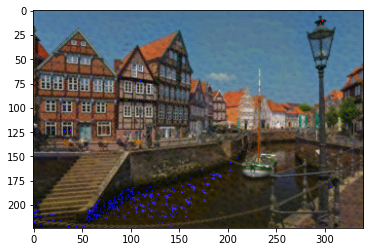

Total loss:  1478374.125


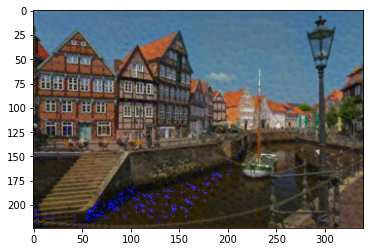

Total loss:  1405428.875


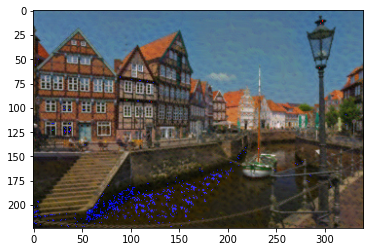

Total loss:  1338281.5


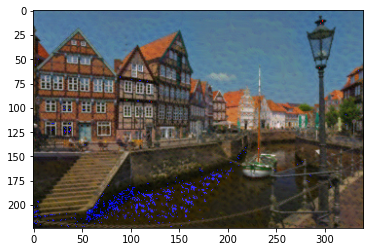

Total loss:  1276253.625


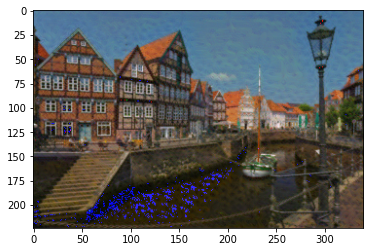

Total loss:  1218790.0


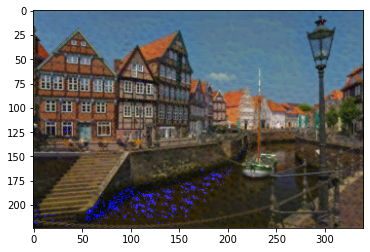

Total loss:  1165438.125


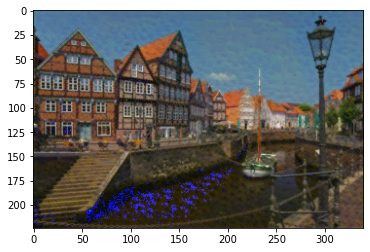

Total loss:  1115801.0


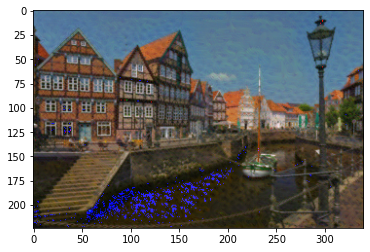

Total loss:  1069484.875


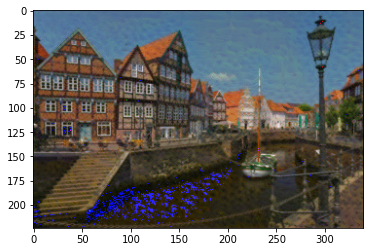

Total loss:  1026194.875


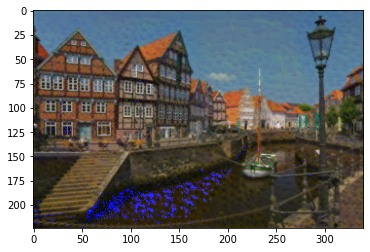

Total loss:  985684.125


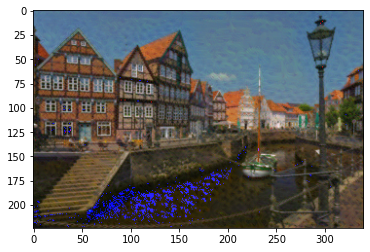

Total loss:  947735.625


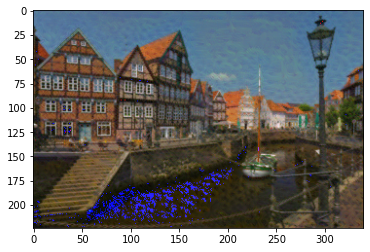

Total loss:  912137.5625


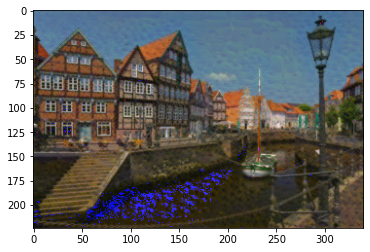

Total loss:  878697.375


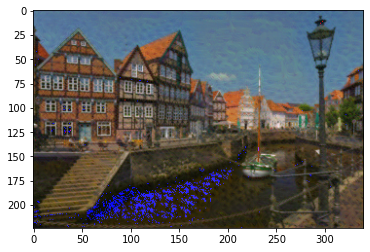

Total loss:  847229.625


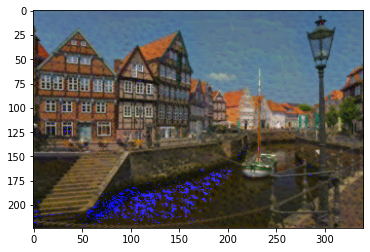

Total loss:  817596.4375


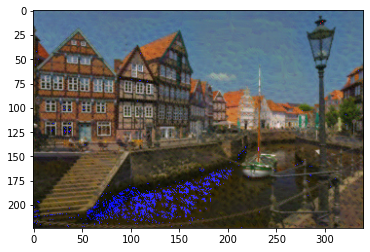

Total loss:  789637.5625


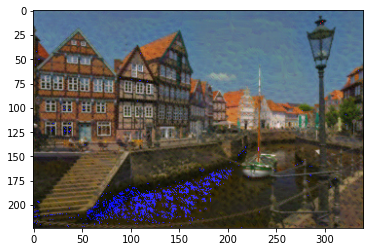

Total loss:  763222.8125


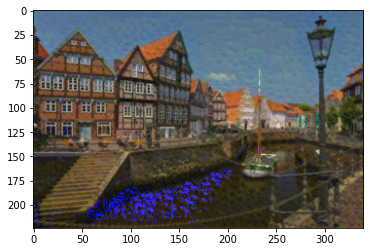

Total loss:  738226.4375


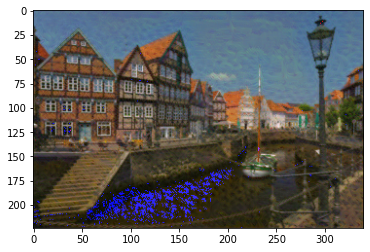

Total loss:  714543.5


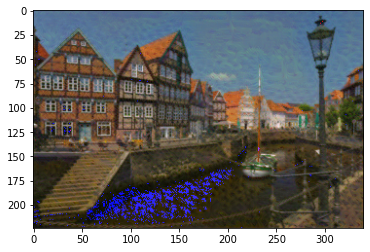

Total loss:  692098.4375


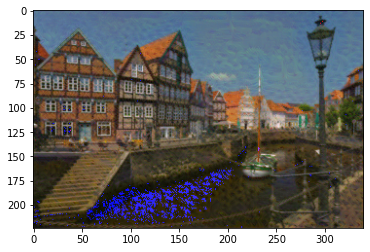

Total loss:  670794.4375


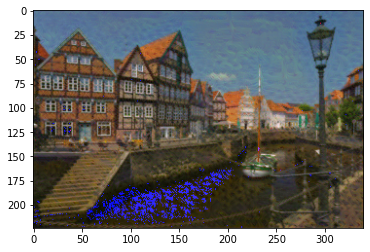

Total loss:  650546.9375


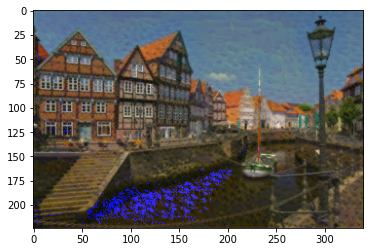

Total loss:  631308.4375


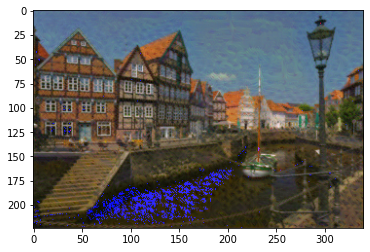

Total loss:  613023.625


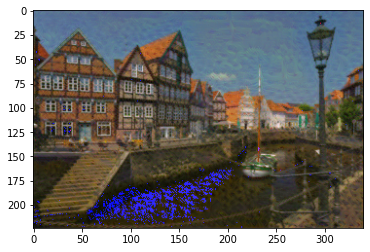

Total loss:  595619.3125


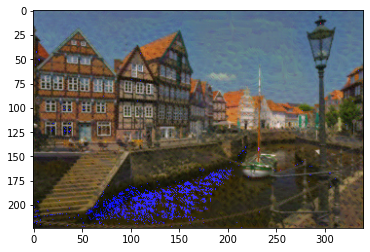

Total loss:  579048.25


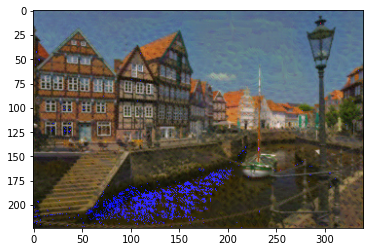

Total loss:  563242.625


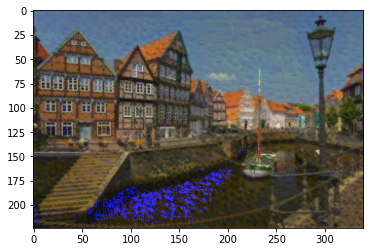

Total loss:  548158.6875


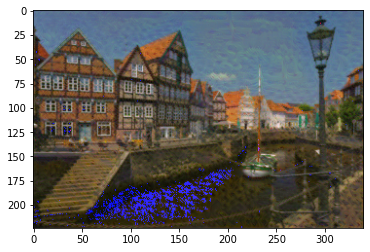

Total loss:  533770.1875


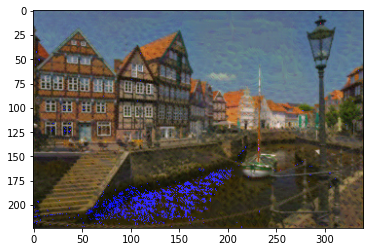

Total loss:  520038.59375


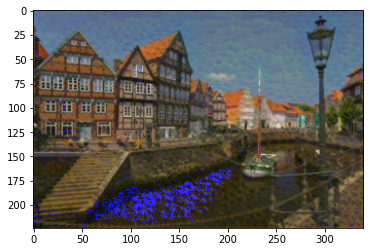

Total loss:  506919.15625


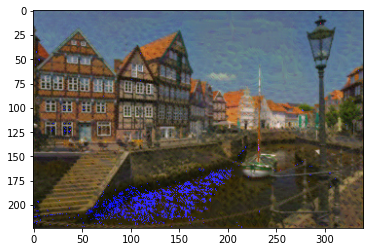

Total loss:  494367.65625


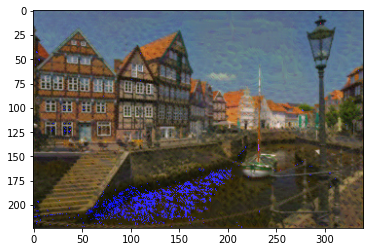

Total loss:  482336.28125


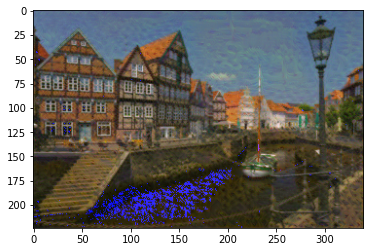

Total loss:  470809.0625


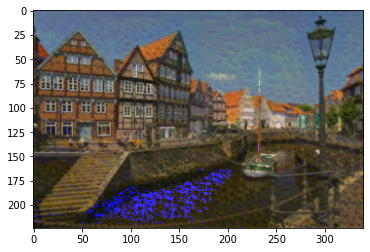

Total loss:  459759.28125


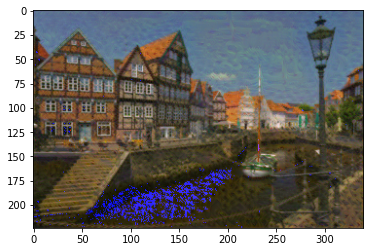

Total loss:  449160.53125


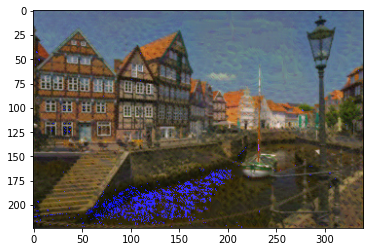

Total loss:  438991.65625


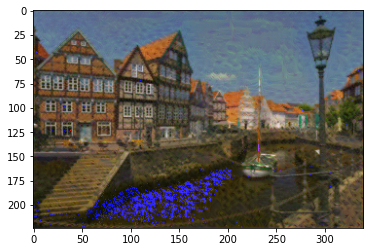

Total loss:  429240.5625


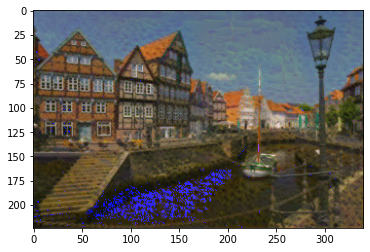

Total loss:  419875.8125


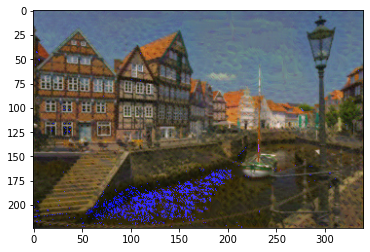

CPU times: user 11min 37s, sys: 2min 1s, total: 13min 39s
Wall time: 10min 55s


In [23]:
%%time

for i in range(1, iterations+1):
    
    #print(i)
    
    target_features = features_extractor(target_img, model, relevant_layers)
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    style_losses = 0
    for layer in style_weights:
        
        target_feature = target_features[layer]
        _, d1, d2, d3 = target_feature.shape
        
        target_reshaped = target_feature.view(d1, d2 * d3)
        target_gram = torch.mm(target_reshaped, target_reshaped.t())
        style_gram = style_grams[layer]
                
        style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        style_losses += style_loss / (d1 * d2 * d3)
        
    total_loss = alpha * content_loss + beta * style_losses
    
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    if  i % print_statement == 0 or i == 1:
        print('Total loss: ', total_loss.item())
        plt.imshow(tensor2image(target_img))
        plt.show()

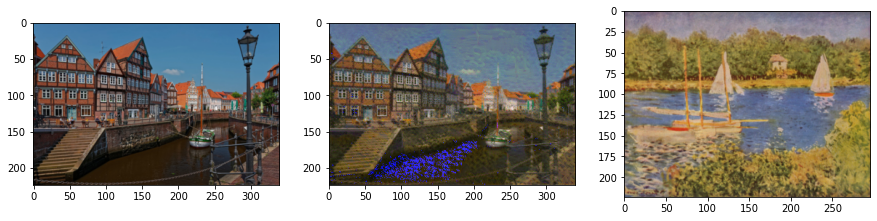

In [24]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
ax1.imshow(tensor2image(content_img))
ax2.imshow(tensor2image(target_img))
ax3.imshow(tensor2image(style_img))
plt.show()

## Exercise 5

In [25]:
import numpy as np
import torch
from torch import nn, optim
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms, models

In [26]:
imsize = 224

loader = transforms.Compose([
    transforms.Resize(imsize), 
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

In [27]:
def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image

In [28]:
content_img = image_loader("data/images/dog.jpg")
style_img = image_loader("data/images/matisse.jpg")

In [29]:
unloader = transforms.Compose([
    transforms.Normalize((-0.485/0.229, -0.456/0.224, -0.406/0.225), (1/0.229, 1/0.224, 1/0.225)),
    transforms.ToPILImage()])

In [30]:
def tensor2image(tensor):
    image = tensor.clone() 
    image = image.squeeze(0)  
    image = unloader(image)
    return image

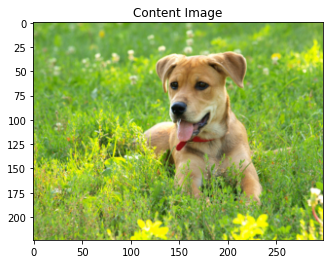

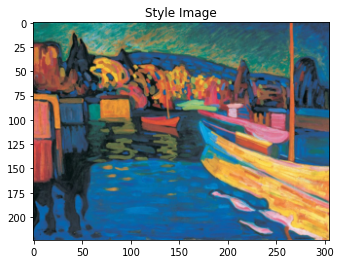

In [31]:
plt.figure()
plt.imshow(tensor2image(content_img))
plt.title("Content Image")
plt.show()

plt.figure()
plt.imshow(tensor2image(style_img))
plt.title("Style Image")
plt.show()

In [32]:
model = models.vgg19(pretrained=True).features

for param in model.parameters():
    param.requires_grad_(False)

In [33]:
print(model)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [34]:
relevant_layers = {'0': 'conv1_1', '5': 'conv2_1', '10': 'conv3_1', '19': 'conv4_1', '21': 'conv4_2', '28': 'conv5_1'}

In [35]:
def features_extractor(x, model, layers):

    features = {}
    for index, layer in model._modules.items():
        x = layer(x)
        if index in layers:
            features[layers[index]] = x
            
    return features

In [36]:
content_features = features_extractor(content_img, model, relevant_layers)
style_features = features_extractor(style_img, model, relevant_layers)

In [37]:
style_grams = {}
for i in style_features:
    layer = style_features[i]
    _, d1, d2, d3 = layer.shape
    features = layer.view(d1, d2 * d3)
    gram = torch.mm(features, features.t())
    style_grams[i] = gram

In [38]:
target_img = content_img.clone().requires_grad_(True)

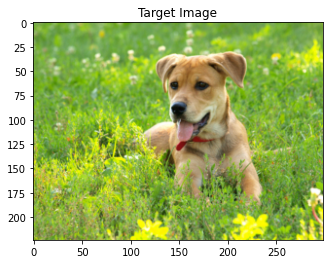

In [39]:
plt.figure()
plt.imshow(tensor2image(target_img))
plt.title("Target Image")
plt.show()

In [40]:
style_weights = {'conv1_1': 1., 'conv2_1': 0.8, 'conv3_1': 0.6, 'conv4_1': 0.4, 'conv5_1': 0.2}

In [41]:
alpha = 1
beta = 1e5

In [46]:
print_statement = 50
optimizer = torch.optim.Adam([target_img], lr=0.001)
iterations = 500

Total loss:  45265156.0


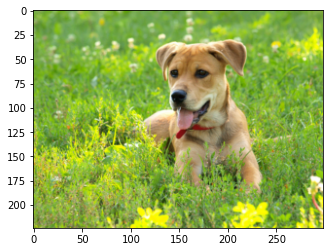

Total loss:  35795652.0


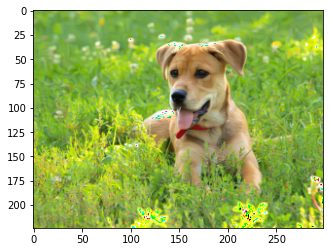

Total loss:  29714548.0


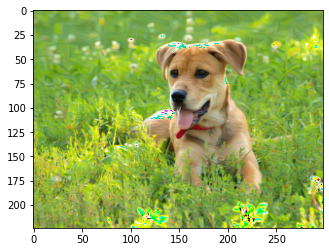

Total loss:  25767956.0


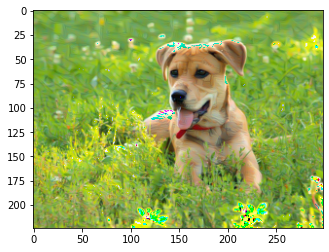

Total loss:  22841038.0


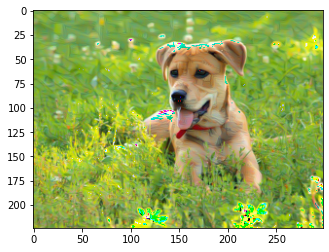

Total loss:  20519980.0


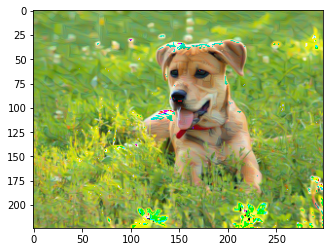

Total loss:  18621918.0


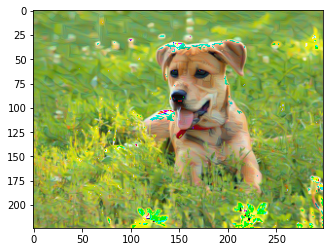

Total loss:  17050758.0


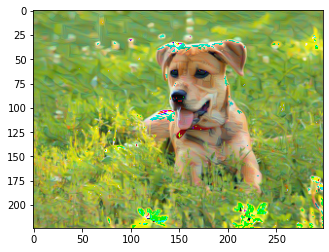

Total loss:  15734945.0


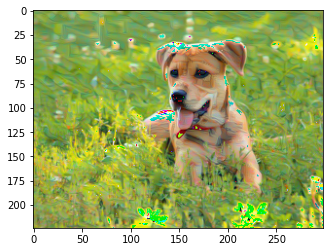

Total loss:  14625854.0


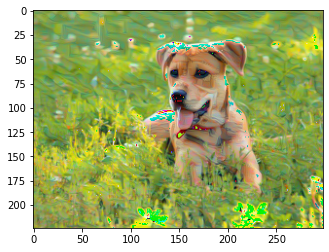

Total loss:  13684212.0


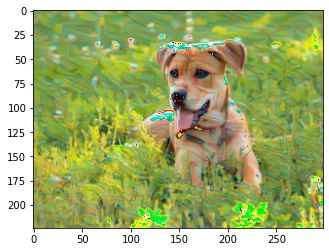

CPU times: user 10min 20s, sys: 1min 51s, total: 12min 11s
Wall time: 9min 48s


In [47]:
%%time

for i in range(1, iterations+1):
    
    target_features = features_extractor(target_img, model, relevant_layers)
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    style_losses = 0
    for layer in style_weights:
        
        target_feature = target_features[layer]
        _, d1, d2, d3 = target_feature.shape
        
        target_reshaped = target_feature.view(d1, d2 * d3)
        target_gram = torch.mm(target_reshaped, target_reshaped.t())
        style_gram = style_grams[layer]
        
        style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        style_losses += style_loss / (d1 * d2 * d3)
        
    total_loss = alpha * content_loss + beta * style_losses
    
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    if  i % print_statement == 0 or i == 1:
        print('Total loss: ', total_loss.item())
        plt.imshow(tensor2image(target_img))
        plt.show()

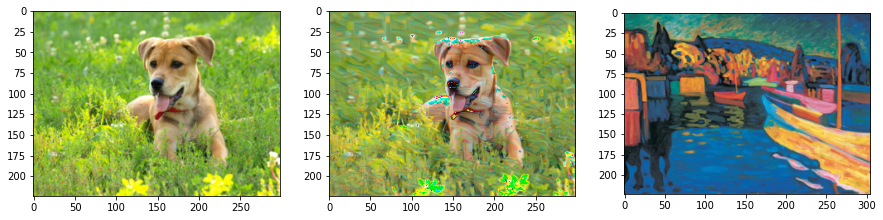

In [48]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
ax1.imshow(tensor2image(content_img))
ax2.imshow(tensor2image(target_img))
ax3.imshow(tensor2image(style_img))
plt.show()